# Pix2Pix - Image to image translation with Conditional Adversarial Networks
> A tutorial on Pix2Pix Conditional GANs and implementation with PyTorch 

- toc: false 
- badges: true
- comments: true
- categories: [gans, pytorch]
- author: "<a href='https://linktr.ee/AniketMaurya'>Aniket Maurya</a>"
- image: https://ik.imagekit.io/aniket/blog/pix2pix/overview_eTCam8Vc0?tr=w-1200,h-628,fo-auto

## Introduction to Conditional Adversarial Networks

![Pix2Pix example 01](https://ik.imagekit.io/aniket/blog/pix2pix/pix2pix-training_4eZEIv0Mo)

Image to Image translation means transforming the given source image into a different image. Gray scale image to colour image conversion is one such example of image of image translation. 

In this tutorial we will discuss [GANs](https://arxiv.org/abs/1406.2661), a few points from Pix2Pix paper and implement the Pix2Pix network to translate segmented facade into real pictures.
We will create the Pix2Pix model in PyTorch and use PyTorch lightning to avoid boilerplates.

> Authors of [Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/abs/1611.07004) paper has also made the source code publically available on [GitHub](https://github.com/phillipi/pix2pix).

> A more detailed tutorial on GANs can be found here - [Yann LeCun’s Deep Learning Course at CDS](https://atcold.github.io/pytorch-Deep-Learning/en/week09/09-3/)

GANs are Generative models that learns a mapping from random noise vector (z) to an output image.
`G(z) -> Image (y)`

For example, GANs can learn mapping from random normal vectors to generate smiley images. For training such a GAN we just need a set of smiley images and train the GAN with an [adversarial loss](https://www.quora.com/What-is-adversarial-loss-in-machine-learning) 🙂. After the model is trained we can use random normal noise vectors to generate images that were not in the training dataset.

But what if we want to build a network in such a way that we can control what the model will generate. In our case we want the model to generate a laughing smiley.

Conditional GANs are Generative networks which learn mapping from random noise vectors and a conditional vector to output an image.
Suppose we have 4 types of smileys - smile, laugh, sad and angry (🙂 😂 😔 😡). So our class vector for smile 🙂 can be `(1,0,0,0)`, laugh can be 😂 `(0,1,0,0)` and similarly for others.
Here the conditional vector is the smiley embedding.

During training of the generator the conditional image is passed to the generator and fake image is generated. The fake image is then passed through the discriminator along with the conditional image, both fake image and conditional image are concatenated. Discriminator penalizes the generator if it correctly classifies the fake image as fake.



## Pix2Pix

**Pix2Pix** is an image-to-image translation Generative Adversarial Networks that learns a mapping from an image X and a random noise Z to output image Y or in simple language it learns to translate the source image into a different distribution of image.

During the time Pix2Pix was released, several other works were also using Conditional GANs on discrete labels. Pix2Pix uses a [U-Net](https://arxiv.org/abs/1505.04597) based architecture for the Generator and for the Discriminator a `PatchGAN Classifier` is used.

![Pix2Pix Generator arch](https://ik.imagekit.io/aniket/blog/pix2pix/pix2pix_Unet_arch_Oen99KmZw)

[Here](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/issues/39#issuecomment-305575964) is what [Phillipi](https://github.com/phillipi) has to say about PatchGAN - 
![pix2pix author patchgan](https://ik.imagekit.io/aniket/blog/pix2pix/patchgan_R2hWYn2z0.png)

Pix2Pix Generator is an U-Net based architecture which is an encoder-decoder network with skip connections. The name U-Net highlights the structure of the "U" shaped network. Both generator and discriminator uses **Convolution-BatchNorm-ReLu** like module or in simple words we can say that it is the unit block of the generator and discriminator.
Skip connections are added between each layer i and layer `n−i`, where n is the total number of layers. At each skip connection all the channels from current layer i are concatenated with all the channels at `n-i` layer.

Lets understand it more with code.

# Carregamento do dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')
PATH = "/content/drive/MyDrive/equipe projeto 1/pix2pix"

Mounted at /content/drive/


In [ ]:
!cp -r "/content/drive/MyDrive/equipe projeto 1/pix2pix/training2.zip" .
!cp -r "/content/drive/MyDrive/equipe projeto 1/pix2pix/validation.zip" .

In [ ]:
!pip install -q pytorch-lightning

     |████████████████████████████████| 585 kB 8.2 MB/s 
     |████████████████████████████████| 419 kB 47.8 MB/s 
     |████████████████████████████████| 140 kB 74.3 MB/s 
     |████████████████████████████████| 596 kB 57.5 MB/s 
     |████████████████████████████████| 1.1 MB 55.6 MB/s 
     |████████████████████████████████| 94 kB 1.3 MB/s 
     |████████████████████████████████| 144 kB 71.2 MB/s 
     |████████████████████████████████| 271 kB 43.4 MB/s 


In [ ]:
# collapse-hide
import os
import numpy as np
from glob import glob
from pathlib import Path

import matplotlib.pyplot as plt
import pytorch_lightning as pl
import torch
from PIL import Image, ImageOps
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.transforms.functional import center_crop
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import cv2
from skimage.metrics import structural_similarity as compare_ssim

Uncomment the below code to download the dataset

In [ ]:
!unzip -o -q training2.zip -d training2
!unzip -o -q validation.zip -d validation

After downloading the dataset we create Dataloader which loads our conditional and real image.

# Diretório

In [ ]:
path = "/content/training2/training2/training2"
path_test = "/content/training2/training2/training2"


In [ ]:
class FacadesDataset(Dataset):
    def __init__(self, path, target_size=None):
        self.filenames = glob(str(Path(path) / "*"))
        for folder in os.listdir(path):
          self.filenames += glob(str(Path("{}/{}".format(path,folder))/ "*"))
        # print(os.listdir(path))
        self.target_size = target_size
        self.filenames = self.filenames[:50]
        

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        image = Image.open(filename)

        image = transforms.functional.to_tensor(image)
        
        image_width = image.shape[2]

        real = image[:, :, : image_width // 2]
        condition = image[:, :, image_width // 2 :]

        target_size = self.target_size
        if target_size:
            condition = nn.functional.interpolate(condition, size=target_size)
            real = nn.functional.interpolate(real, size=target_size)

        return real, condition
    def get_concat_h(self, im1, im2):
        dst = Image.new('RGB', (im1.width + im2.width, im1.height))
        dst.paste(im1, (0, 0))
        dst.paste(im2, (im1.width, 0))
        return dst

# Leitura do modelo

In the first part of U-Net shaped network the layer size decreases, we create a `DownSampleConv` module for this. This module will contain the unit block that we just created `ConvBlock`.

In [ ]:
class DownSampleConv(nn.Module):

    def __init__(self, in_channels, out_channels, kernel=4, strides=2, padding=1, activation=True, batchnorm=True):
        """
        Paper details:
        - C64-C128-C256-C512-C512-C512-C512-C512
        - All convolutions are 4×4 spatial filters applied with stride 2
        - Convolutions in the encoder downsample by a factor of 2
        """
        super().__init__()
        self.activation = activation
        self.batchnorm = batchnorm

        self.conv = nn.Conv2d(in_channels, out_channels, kernel, strides, padding)

        if batchnorm:
            self.bn = nn.BatchNorm2d(out_channels)

        if activation:
            self.act = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = self.conv(x)
        if self.batchnorm:
            x = self.bn(x)
        if self.activation:
            x = self.act(x)
        return x

Now in the second part the network expands and so we create `UpSampleConv`

In [ ]:
class UpSampleConv(nn.Module):

    def __init__(
        self,
        in_channels,
        out_channels,
        kernel=4,
        strides=2,
        padding=1,
        activation=True,
        batchnorm=True,
        dropout=False
    ):
        super().__init__()
        self.activation = activation
        self.batchnorm = batchnorm
        self.dropout = dropout

        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel, strides, padding)

        if batchnorm:
            self.bn = nn.BatchNorm2d(out_channels)

        if activation:
            self.act = nn.ReLU(True)

        if dropout:
            self.drop = nn.Dropout2d(0.5)

    def forward(self, x):
        x = self.deconv(x)
        if self.batchnorm:
            x = self.bn(x)

        if self.dropout:
            x = self.drop(x)
        return x

Now the basic blocks of the Pix2Pix generated is created, we create the generator module. Generator is formed of expanding and contracting layers.
The first part network contracts and then expands again, i.e. first we have encoder block and then decoder block.
Below is the encoder-decoder of U-Net network configuration from official paper. Here `C` denotes the unit block that we created `ConvBlock` and `D` denotes `Drop Out` with value _0.5_.
In the decoder, the output tensors from `n-i` layer of encoder concatenates with `i` layer of the decoder. Also the first three blocks of the decoder has drop out layers.

```
Encoder:  C64-C128-C256-C512-C512-C512-C512-C512

Decoder:  CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
```

In [ ]:
class Generator(nn.Module):

    def __init__(self, in_channels, out_channels):
        """
        Paper details:
        - Encoder: C64-C128-C256-C512-C512-C512-C512-C512
        - All convolutions are 4×4 spatial filters applied with stride 2
        - Convolutions in the encoder downsample by a factor of 2
        - Decoder: CD512-CD1024-CD1024-C1024-C1024-C512 -C256-C128
        """
        super().__init__()

        # encoder/donwsample convs
        self.encoders = [
            DownSampleConv(in_channels, 64, batchnorm=False),  # bs x 64 x 128 x 128
            DownSampleConv(64, 128),  # bs x 128 x 64 x 64
            DownSampleConv(128, 256),  # bs x 256 x 32 x 32
            DownSampleConv(256, 512),  # bs x 512 x 16 x 16
            DownSampleConv(512, 512),  # bs x 512 x 8 x 8
            DownSampleConv(512, 512),  # bs x 512 x 4 x 4
            DownSampleConv(512, 512),  # bs x 512 x 2 x 2
            DownSampleConv(512, 512, batchnorm=False),  # bs x 512 x 1 x 1
        ]

        # decoder/upsample convs
        self.decoders = [
            UpSampleConv(512, 512, dropout=True),  # bs x 512 x 2 x 2
            UpSampleConv(1024, 512, dropout=True),  # bs x 512 x 4 x 4
            UpSampleConv(1024, 512, dropout=True),  # bs x 512 x 8 x 8
            UpSampleConv(1024, 512),  # bs x 512 x 16 x 16
            UpSampleConv(1024, 256),  # bs x 256 x 32 x 32
            UpSampleConv(512, 128),  # bs x 128 x 64 x 64
            UpSampleConv(256, 64),  # bs x 64 x 128 x 128
        ]
        self.decoder_channels = [512, 512, 512, 512, 256, 128, 64]
        self.final_conv = nn.ConvTranspose2d(64, out_channels, kernel_size=4, stride=2, padding=1)
        self.tanh = nn.Tanh()

        self.encoders = nn.ModuleList(self.encoders)
        self.decoders = nn.ModuleList(self.decoders)

    def forward(self, x):
        skips_cons = []
        for encoder in self.encoders:
            x = encoder(x)

            skips_cons.append(x)

        skips_cons = list(reversed(skips_cons[:-1]))
        decoders = self.decoders[:-1]

        for decoder, skip in zip(decoders, skips_cons):
            x = decoder(x)
            # print(x.shape, skip.shape)
            x = torch.cat((x, skip), axis=1)

        x = self.decoders[-1](x)
        # print(x.shape)
        x = self.final_conv(x)
        return self.tanh(x)

### Discriminator
A discriminator is a ConvNet which learns to classify images into discrete labels. In GANs, discriminators learns to predict whether the given image is real or fake.
PatchGAN is the discriminator used for Pix2Pix. Its architecture is different from a typical image classification ConvNet because of the output layer size. In convnets output layer size is equal to the number of classes while in PatchGAN output layer size is a 2D matrix.

Now we create our Discriminator - **PatchGAN**. In this network we use the same `DownSampleConv` module that we created for generator.

In [ ]:
class PatchGAN(nn.Module):

    def __init__(self, input_channels):
        super().__init__()
        self.d1 = DownSampleConv(input_channels, 64, batchnorm=False)
        self.d2 = DownSampleConv(64, 128)
        self.d3 = DownSampleConv(128, 256)
        self.d4 = DownSampleConv(256, 512)
        self.final = nn.Conv2d(512, 1, kernel_size=1)

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.d1(x)
        x1 = self.d2(x0)
        x2 = self.d3(x1)
        x3 = self.d4(x2)
        xn = self.final(x3)
        return xn

### Loss Function

Loss function used in Pix2Pix are `Adversarial loss` and  `Reconstruction loss`. Adversarial loss is used to penalize the generator to predict more realistic images. In conditional GANs, generators job is not only to produce realistic image but also to be near the ground truth output. Reconstruction Loss helps network to produce the realistic image near the conditional image.


```python
adversarial_loss = nn.BCEWithLogitsLoss()

reconstruction_loss = nn.L1Loss()
```

In [ ]:
#collapse-hide
# https://stackoverflow.com/questions/49433936/how-to-initialize-weights-in-pytorch

def _weights_init(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
        
def display_progress(cond, fake, real, figsize=(10,5)):
    cond = cond.detach().cpu().permute(1, 2, 0)
    fake = fake.detach().cpu().permute(1, 2, 0)
    real = real.detach().cpu().permute(1, 2, 0)


    fig, ax = plt.subplots(1, 3, figsize=figsize)
    ax[0].imshow(cond)
    ax[0].title.set_text('Input Image')
    ax[0].axis('off')
    ax[2].imshow(fake)
    ax[2].title.set_text('Predicted Image')
    ax[2].axis('off')
    ax[1].imshow(real)
    ax[1].title.set_text('Ground Truth')
    ax[1].axis('off')
    plt.show()

In [ ]:
class Pix2Pix(pl.LightningModule):

    def __init__(self, in_channels, out_channels, learning_rate=0.0002, lambda_recon=200, display_step=25):

        super().__init__()
        self.save_hyperparameters()
        
        self.display_step = display_step
        self.gen = Generator(in_channels, out_channels)
        self.patch_gan = PatchGAN(in_channels + out_channels)

        # intializing weights
        self.gen = self.gen.apply(_weights_init)
        self.patch_gan = self.patch_gan.apply(_weights_init)

        self.adversarial_criterion = nn.BCEWithLogitsLoss()
        self.recon_criterion = nn.L1Loss()
        self.psnrs = []
        self.ssims = []

    def _gen_step(self, real_images, conditioned_images):
        # Pix2Pix has adversarial and a reconstruction loss
        # First calculate the adversarial loss
        fake_images = self.gen(conditioned_images)
        disc_logits = self.patch_gan(fake_images, conditioned_images)
        adversarial_loss = self.adversarial_criterion(disc_logits, torch.ones_like(disc_logits))

        # calculate reconstruction loss
        recon_loss = self.recon_criterion(fake_images, real_images)
        lambda_recon = self.hparams.lambda_recon

        return adversarial_loss + lambda_recon * recon_loss

    def _disc_step(self, real_images, conditioned_images):
        fake_images = self.gen(conditioned_images).detach()
        fake_logits = self.patch_gan(fake_images, conditioned_images)

        real_logits = self.patch_gan(real_images, conditioned_images)

        fake_loss = self.adversarial_criterion(fake_logits, torch.zeros_like(fake_logits))
        real_loss = self.adversarial_criterion(real_logits, torch.ones_like(real_logits))
        return (real_loss + fake_loss) / 2

    def configure_optimizers(self):
        lr = self.hparams.learning_rate
        gen_opt = torch.optim.Adam(self.gen.parameters(), lr=lr)
        disc_opt = torch.optim.Adam(self.patch_gan.parameters(), lr=lr)
        return disc_opt, gen_opt

    def training_step(self, batch, batch_idx, optimizer_idx):
        real, condition = batch

        loss = None
        if optimizer_idx == 0:
            loss = self._disc_step(real, condition)
            self.log('PatchGAN Loss', loss)
        elif optimizer_idx == 1:
            loss = self._gen_step(real, condition)
            self.log('Generator Loss', loss)
        
        if self.current_epoch%self.display_step==0 and batch_idx==0 and optimizer_idx==1:
            fake = self.gen(condition).detach()
            display_progress(condition[0], fake[0], real[0])
        return loss

    def test_step(self, batch, batch_idx):
        real, condition = batch
        fake = self.gen(condition).detach()
        display_progress(condition[0], fake[0], real[0])

        fake_cpu = fake[0].cpu()
        real_cpu = real[0].cpu()
        #PSNR
        psnr = cv2.PSNR(real_cpu.numpy(),fake_cpu.numpy())
        print("Valor do PNSR: %.4f" % (psnr))
        #SSIM
        ssim = compare_ssim(real_cpu.numpy(), fake_cpu.numpy(), multichannel=True, win_size=3)
        print("Valor do SSIM: %.4f" % (ssim))
        self.psnrs.append(psnr)
        self.ssims.append(ssim)

        return fake
    def calcula_metricas(self):
        psnr = sum(self.psnrs)/len(self.psnrs)
        ssim = sum(self.ssims)/len(self.ssims)

        return psnr, ssim
    # `training_step()`, 
    def train_dataloader(self):
        pass

Now that the network is implemented now we are ready to train. You can also modify the dataloader and train on custom dataset.

> Recently I contributed to Pytorch Lightning and now the Pix2Pix model is also available on [Pytorch Lightning Bolts](https://github.com/PyTorchLightning/pytorch-lightning-bolts/blob/master/pl_bolts/models/gans/pix2pix/pix2pix_module.py), feel free to try that out as well.

Hope you liked the article! Happy training 😃

# Preparando para o treinamento

In [ ]:
# hide
# These configurations are from paper

adv_criterion = nn.BCEWithLogitsLoss() 
recon_criterion = nn.L1Loss() 
lambda_recon = 200

n_epochs = 20

display_step = 100
batch_size = 16
lr = 0.0002
target_size = 256
device = 'cuda'

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: /content/lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                  | Type              | Params
------------------------------------------------------------
0 | gen                   | Generator         | 54.4 M
1 | patch_gan             | PatchGAN          | 2.8 M 
2 | adversarial_criterion | BCEWithLogitsLoss | 0     
3 | recon_criterion       | L1Loss            | 0     
------------------------------------------------------------
57.2 M    Trainable params
0         Non-trainable params
57.2 M    Total params
228.713   Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1937: PossibleUserWarning: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_

Training: 0it [00:00, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


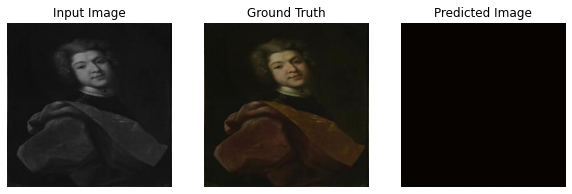

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


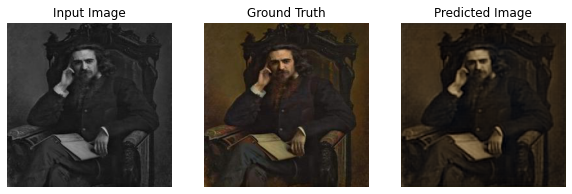

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


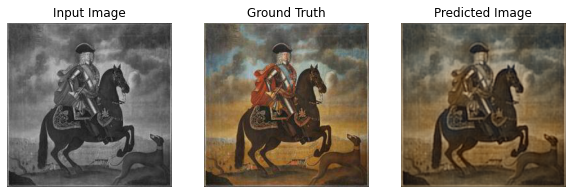

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


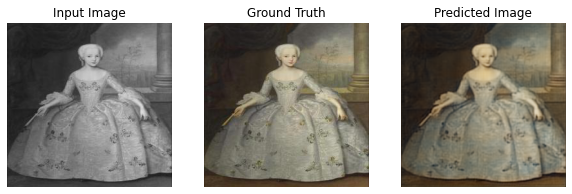

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


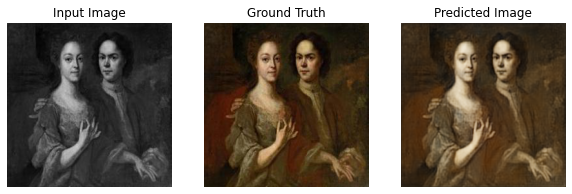

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


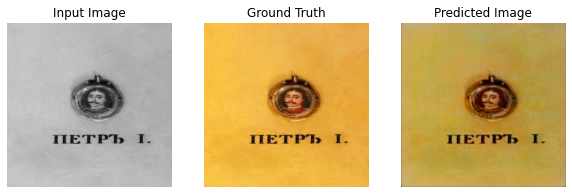

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


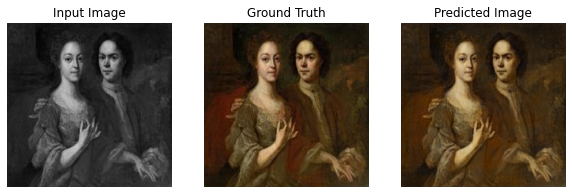

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


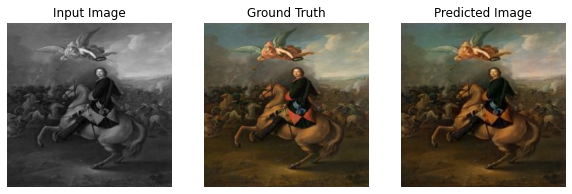

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


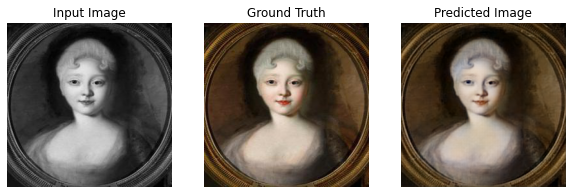

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


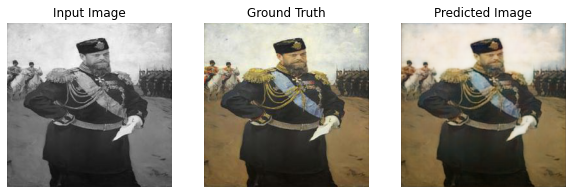

In [ ]:
dataset = FacadesDataset(path, target_size=target_size)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

pix2pix = Pix2Pix(3, 3, learning_rate=lr, lambda_recon=lambda_recon, display_step=display_step)
trainer = pl.Trainer(max_epochs=1000, gpus=1)
trainer.fit(pix2pix, dataloader)

In [ ]:
torch.save(pix2pix.state_dict(), PATH + "weigths2.pth")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


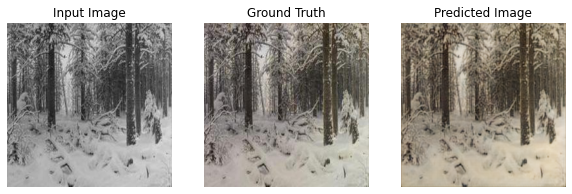

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 76.0927
Valor do SSIM: 0.8671


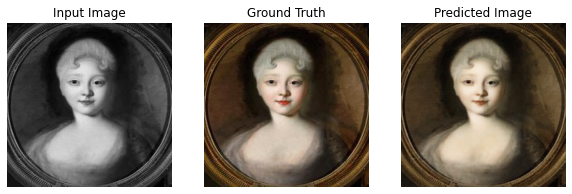

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 78.6518
Valor do SSIM: 0.9547


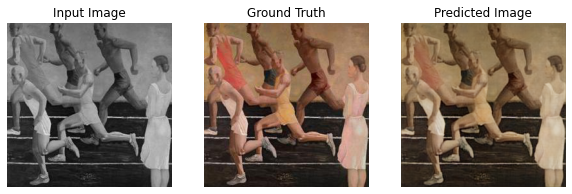

Valor do PNSR: 77.9039
Valor do SSIM: 0.9528


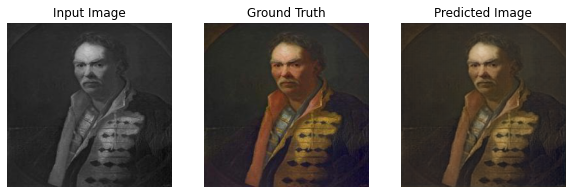

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.8154
Valor do SSIM: 0.9361


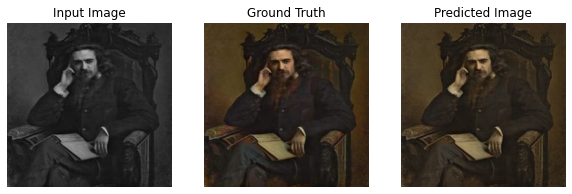

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 82.8352
Valor do SSIM: 0.9642


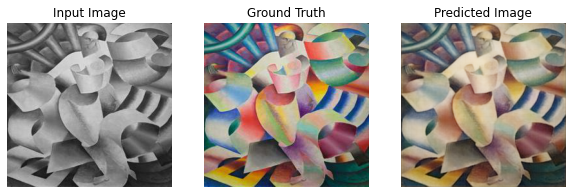

Valor do PNSR: 71.0319
Valor do SSIM: 0.7937


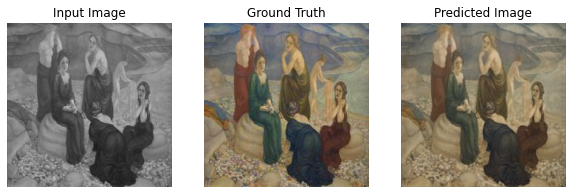

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 78.2133
Valor do SSIM: 0.8822


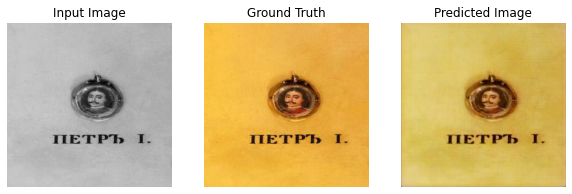

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 69.5197
Valor do SSIM: 0.9411


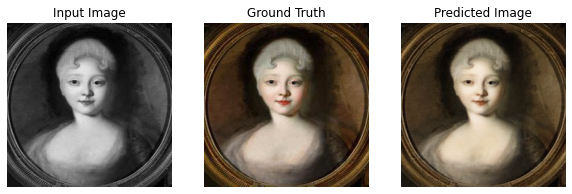

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 78.6518
Valor do SSIM: 0.9547


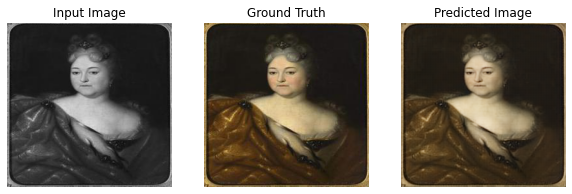

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 79.5438
Valor do SSIM: 0.9665


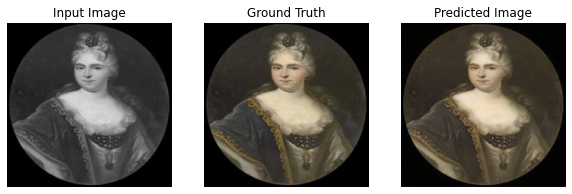

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 81.4253
Valor do SSIM: 0.9122


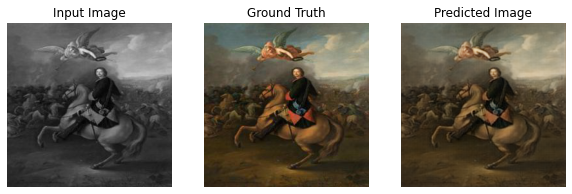

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.2339
Valor do SSIM: 0.9483


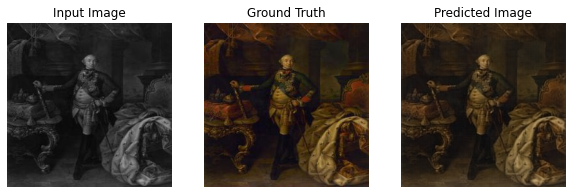

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.8057
Valor do SSIM: 0.9543


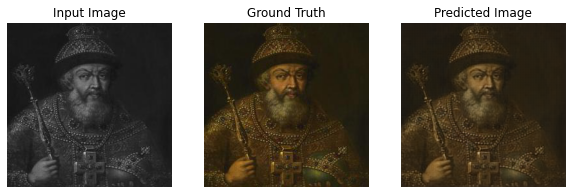

Valor do PNSR: 80.2834
Valor do SSIM: 0.9705


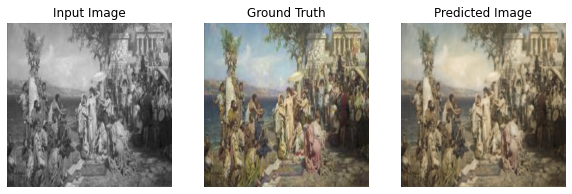

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 76.2687
Valor do SSIM: 0.8394


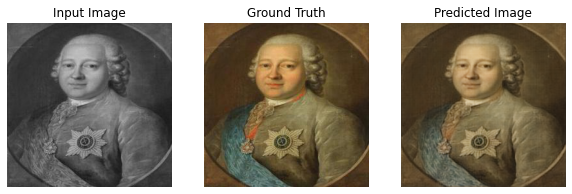

Valor do PNSR: 79.6526
Valor do SSIM: 0.9600


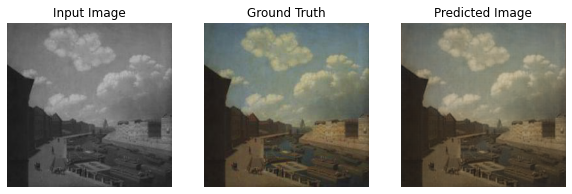

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 79.4260
Valor do SSIM: 0.8866


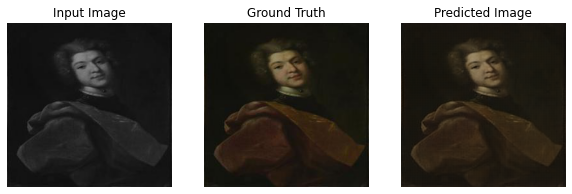

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 84.0827
Valor do SSIM: 0.9725


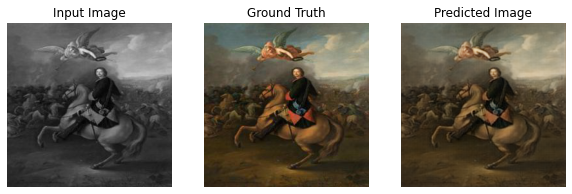

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.2339
Valor do SSIM: 0.9483


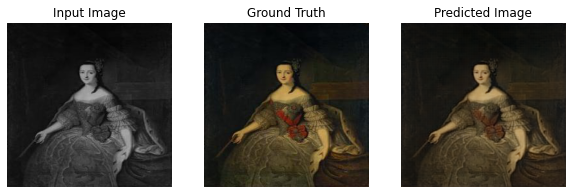

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 81.6299
Valor do SSIM: 0.9543


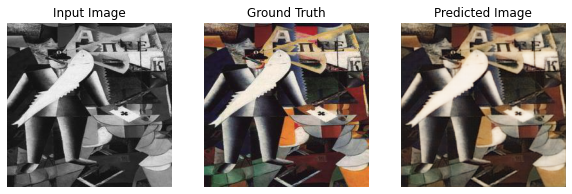

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 74.3716
Valor do SSIM: 0.8712


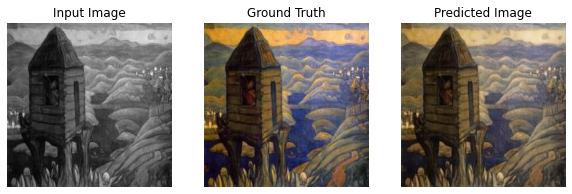

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 74.2355
Valor do SSIM: 0.8254


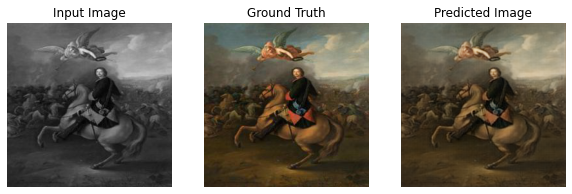

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.2339
Valor do SSIM: 0.9483


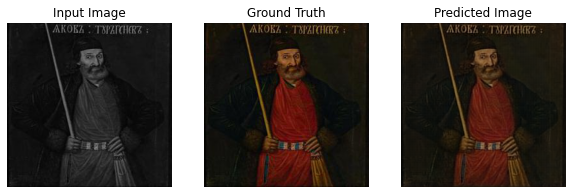

Valor do PNSR: 80.6064
Valor do SSIM: 0.9525


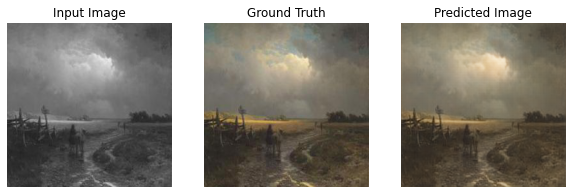

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 81.5240
Valor do SSIM: 0.9485


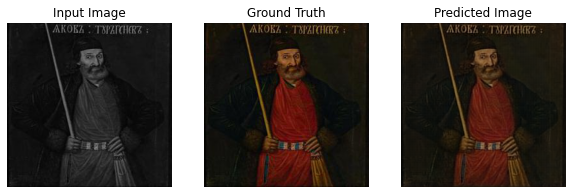

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.6064
Valor do SSIM: 0.9525


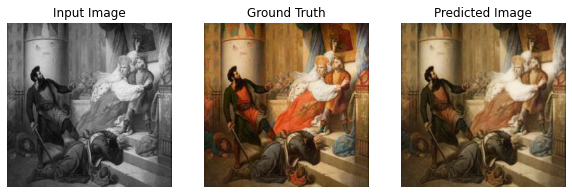

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 74.6713
Valor do SSIM: 0.9471


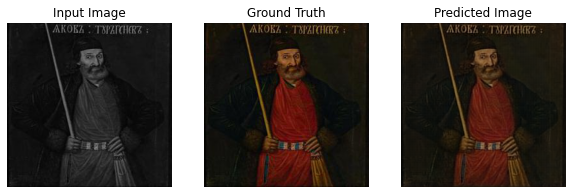

Valor do PNSR: 80.6064
Valor do SSIM: 0.9525


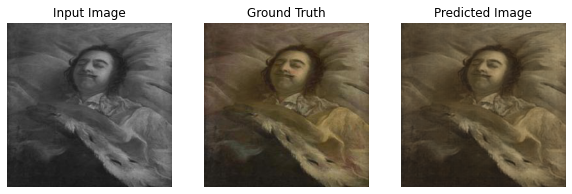

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 84.8776
Valor do SSIM: 0.9837


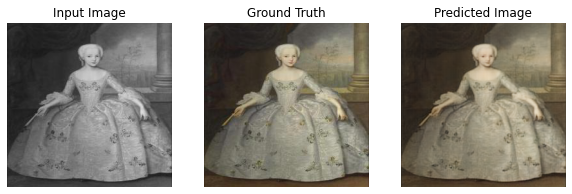

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.8121
Valor do SSIM: 0.9493


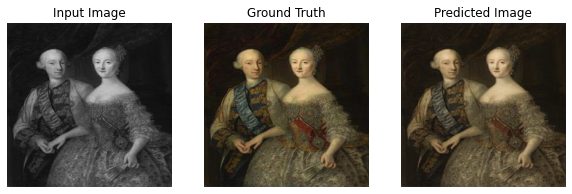

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 81.7224
Valor do SSIM: 0.9690


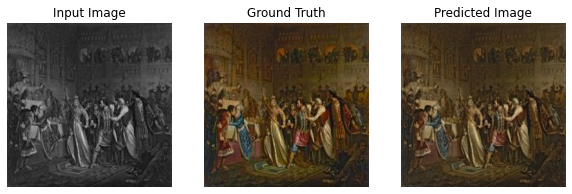

Valor do PNSR: 80.0002
Valor do SSIM: 0.9640


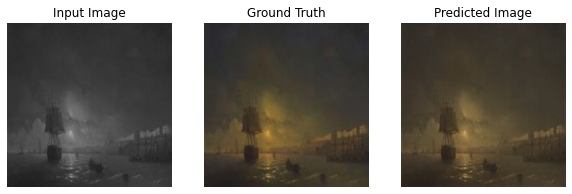

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 82.8955
Valor do SSIM: 0.9470


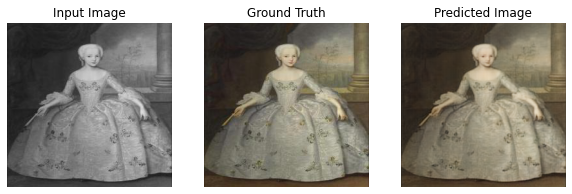

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.8121
Valor do SSIM: 0.9493


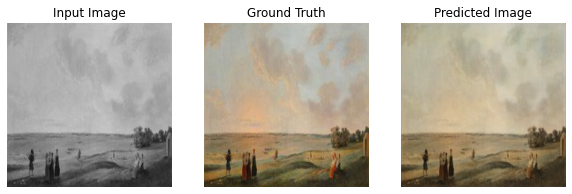

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 78.8823
Valor do SSIM: 0.9426


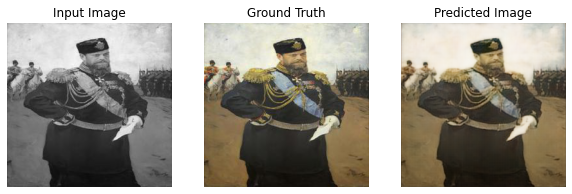

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 76.9370
Valor do SSIM: 0.9230


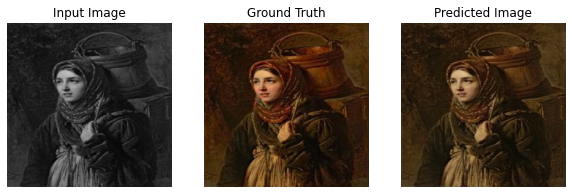

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 79.7536
Valor do SSIM: 0.9646


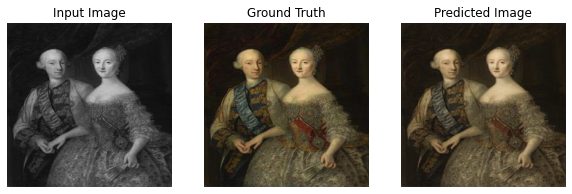

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 81.7224
Valor do SSIM: 0.9690


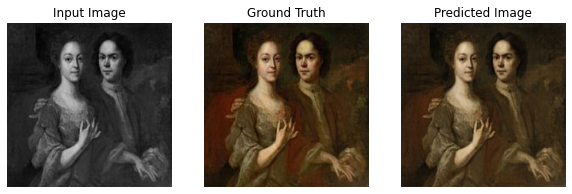

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 81.1422
Valor do SSIM: 0.9726


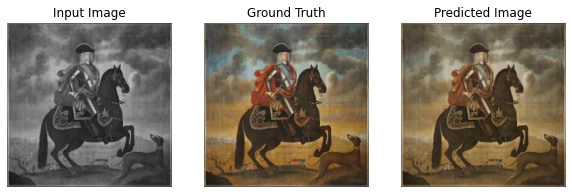

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 77.0781
Valor do SSIM: 0.9026


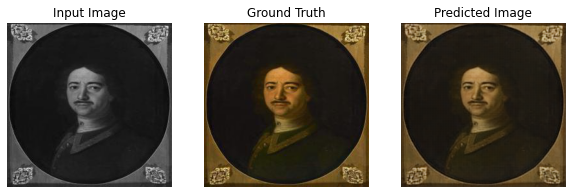

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 78.8534
Valor do SSIM: 0.9609


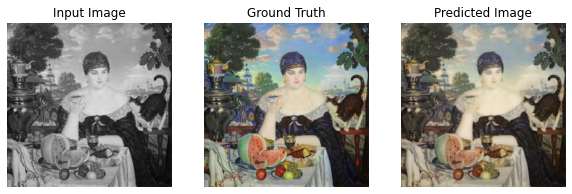

Valor do PNSR: 73.8240
Valor do SSIM: 0.8087


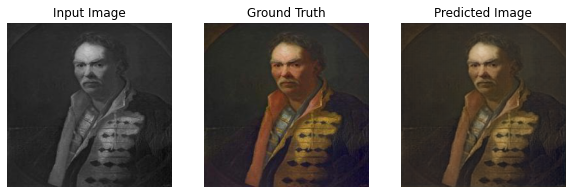

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.8154
Valor do SSIM: 0.9361


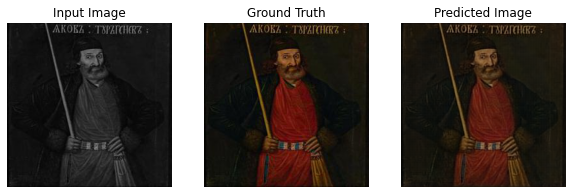

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 80.6064
Valor do SSIM: 0.9525


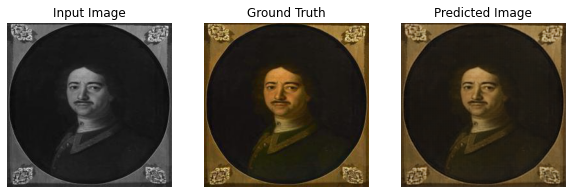

Valor do PNSR: 78.8534
Valor do SSIM: 0.9609


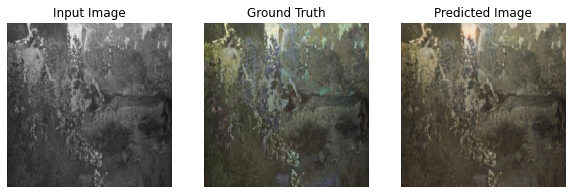

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 78.9074
Valor do SSIM: 0.8984


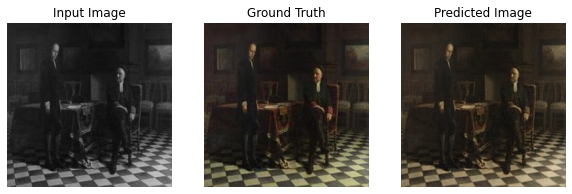

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 81.9422
Valor do SSIM: 0.9632


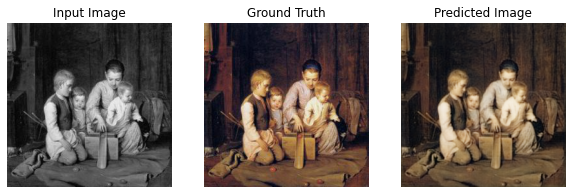

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 77.7315
Valor do SSIM: 0.9169


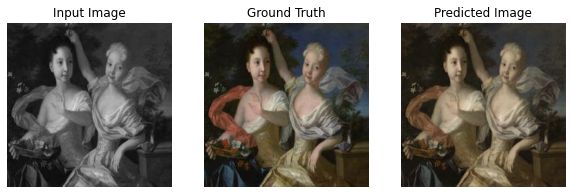

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Valor do PNSR: 79.7012
Valor do SSIM: 0.9168


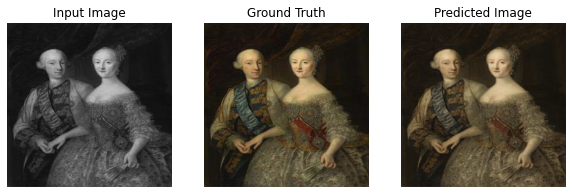

Valor do PNSR: 81.7224
Valor do SSIM: 0.9690


[{}]

In [ ]:
dataset_test = FacadesDataset(path_test)
dataloader_test = DataLoader(dataset_test)

pix2pix = Pix2Pix(3, 3, learning_rate=lr, lambda_recon=lambda_recon, display_step=display_step)
trainer = pl.Trainer(max_epochs=300, gpus=1)

pesos = torch.load(PATH + "weigths2.pth")
pix2pix.load_state_dict(pesos)
pix2pix.eval()

trainer.test(pix2pix, dataloader_test)



In [ ]:
# Calcula a média das métricas psnr e ssim:
pix2pix.calcula_metricas()

(79.2749969997873, 0.933547080052114)